In [71]:
#coding: utf-8
import numpy as np
import sys
import os
import os.path

from collections import OrderedDict
import matplotlib.pyplot as plt

In [3]:
sys.path.append(os.pardir)
from dataset.mnist import load_mnist

In [4]:
def sigmoid(x):
    return 1 / (1+np.exp(x))

def sigmoid_d(x):
    return (1.0 - sigmoid(x)) * sigmoid(x)

def relu(x):
    return np.maximum(0, x)

def relu_d(x):
    grad = np.zeros_like(x)
    grad[x>=0] = 1
    return grad

def softmax(x):
    x = x - np.max(x, axis=-1, keepdims=True) # オーバーフロー防止用
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

def cross_entropy_error(prob, t):
    
    if prob.ndim == 1:
        t = t.reshape(1, prob.size)
        prob = prob.reshape(1, prob.size)
        
    if t.size == prob.size:
        t = t.argmax(axis=1)
             
    batch_size = prob.shape[0]
    return -np.sum(np.log(prob[np.arange(batch_size), t] + 1e-7)) / batch_size
    
    #return -np.mean(np.log(prob[np.arrange(prob.shape[0]), t] + 1e-7))

def root_square_mean_error(y, t):
    return 0.5 * np.sum((y-t)**2) # 比較には平方根はいらない

In [5]:
(x_train, t_train), (x_test, t_test) = load_mnist(flatten=True, normalize=False)

In [6]:
print(x_test[1])

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0 116 125 171 255 255 150  93   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0 169 253 253 253 253
 253 253 218  30   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0 169 253 253 253 213 142 176 253 253 122   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0  52 250 253 210  32
  12   0   6 206 253 140   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0  77 251 210  25   0   0   0 122 248 253  65   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  31  18
   0   0   0   0 209 253 253  65   0   0   0   0   

In [7]:
class Sigmoid_Layer:
    def __init__(self):
        self.out = None
    
    def forward(self, x):
        self.out = sigmoid(x)
        return self.out
    
    def backward(self, dout):
        return dout * (1.0 - self.out) * self.out

In [8]:
sig = Sigmoid_Layer()

In [9]:
print(sig.forward(3))

0.04742587317756678


In [10]:
class ReLU_Layer:
    def __init__(self):
        self.mask = None
    
    def forward(self, x):
        out = np.maximum(x, 0)
        self.mask = np.sign(out)
        return out
    
    def backward(self, dout):
        return self.mask * dout

In [11]:
class Softmax_Loss_Layer:
    def __init__(self, error_type=1):
        self.loss = None
        self.y = None
        self.t = None
        self.error_type = error_type
        
    def forward(self, x, t):
        self.t = t
        self.y = softmax(x)
        if self.error_type == 1:
            self.loss = root_square_mean_error(self.y, self.t) # 二乗平均誤差
        elif self.error_type == 2:
            self.loss = cross_entropy_error(self.y, self.t) # 交差クロスエントロピー誤差
        else:
            print("error_type should be 1 or 2")
            
        return self.loss
    
    def backward(self, dout=1):
        batch_size = self.t.shape[0]
        dx = (self.y - self.t) / batch_size
        return dx

In [12]:
x = np.array([[1.0, -0.5],[-2.0, 3.0]])
print(x)

[[ 1.  -0.5]
 [-2.   3. ]]


In [13]:
relu = ReLU_Layer()
relu.forward(x)

array([[1., 0.],
       [0., 3.]])

In [14]:
class Linear_Layer:
    def __init__(self, W, b):
        self.W = W
        self.b = b
        self.x = None
        self.W_grad = None
        self.b_grad = None
        
    def forward(self, x):
        self.x = x
        return np.dot(x, self.W) + self.b
    
    def backward(self, dout):
        self.W_grad = np.dot(self.x.T, dout)
        self.b_grad = np.sum(dout, axis=0)
        return np.dot(dout, self.W.T)

In [15]:
A = [[1,2],[3,4]]
af = Linear_Layer([1,1],[0,0])
af.forward(A)

array([3, 7])

In [83]:
class NeuralNet_3layer:

    def __init__(self, input_size, hidden_size, output_size, weight_init_value = 0.01):
        # 重みの初期化
        self.params = {}
        self.params['W1'] = weight_init_value * np.random.randn(input_size, hidden_size)
        self.params['b1'] = np.zeros(hidden_size)
        self.params['W2'] = weight_init_value * np.random.randn(hidden_size, output_size) 
        self.params['b2'] = np.zeros(output_size)

        # レイヤの生成
        self.layers = OrderedDict()
        self.layers['Affine1'] = Linear_Layer(self.params['W1'], self.params['b1'])
        self.layers['Relu1'] = ReLU_Layer()
        self.layers['Affine2'] = Linear_Layer(self.params['W2'], self.params['b2'])

        self.OutputLayer = Softmax_Loss_Layer(2)
        
    def predict(self, x):
        for layer in self.layers.values():
            x = layer.forward(x)
        
        return x
        
    # x:入力データ, t:教師データ
    def loss(self, x, t):
        y = self.predict(x)
        return self.OutputLayer.forward(y, t)
    
    def accuracy(self, x, t):
        y = self.predict(x)
        y = np.argmax(y, axis=1)
        if t.ndim != 1 : t = np.argmax(t, axis=1)
        
        accuracy = np.sum(y == t) / float(x.shape[0])
        return accuracy
        
    # x:入力データ, t:教師データ
    def numerical_gradient(self, x, t):
        loss_W = lambda W: self.loss(x, t)
        
        grads = {}
        grads['W1'] = numerical_gradient(loss_W, self.params['W1'])
        grads['b1'] = numerical_gradient(loss_W, self.params['b1'])
        grads['W2'] = numerical_gradient(loss_W, self.params['W2'])
        grads['b2'] = numerical_gradient(loss_W, self.params['b2'])
        
        return grads
        
    def gradient(self, x, t):
        # forward
        self.loss(x, t)

        # backward
        dout = 1
        dout = self.OutputLayer.backward(dout)
        
        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout)

        # 設定
        grads = {}
        grads['W1'], grads['b1'] = self.layers['Affine1'].W_grad, self.layers['Affine1'].b_grad
        grads['W2'], grads['b2'] = self.layers['Affine2'].W_grad, self.layers['Affine2'].b_grad

        return grads


In [85]:
# データの読み込み
(x_train, t_train), (x_test, t_test) = load_mnist(normalize=True, one_hot_label=True)

net_3 = NeuralNet_3layer(input_size=784, hidden_size=2, output_size=10)

iters_num = 10200 
train_size = x_train.shape[0]
batch_size = 100
learning_rate = 0.1

train_loss_list = []
train_acc_list = []
test_acc_list = []

iter_per_epoch = max(train_size / batch_size, 1)

for i in range(iters_num):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = x_train[batch_mask]
    t_batch = t_train[batch_mask]
    
    # 勾配
    grad = net_3.gradient(x_batch, t_batch)
    
    # 更新
    for key in ('W1', 'b1', 'W2', 'b2'):
        net_3.params[key] -= learning_rate * grad[key]
    
    loss = net_3.loss(x_batch, t_batch)
    train_loss_list.append(loss)
    
    if i % iter_per_epoch == 0:
        train_acc = net_3.accuracy(x_train, t_train)
        test_acc = net_3.accuracy(x_test, t_test)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)
        print(train_acc, test_acc)


0.088 0.0897
0.5578166666666666 0.5605
0.5951333333333333 0.5959
0.6082666666666666 0.6096
0.6209 0.6166
0.64395 0.6396
0.6351 0.6277
0.6327166666666667 0.627
0.6374 0.6283
0.6346666666666667 0.6325
0.64645 0.6413
0.6580333333333334 0.6613
0.6437333333333334 0.6448
0.6436166666666666 0.6422
0.67085 0.6763
0.6538666666666667 0.6547
0.6750166666666667 0.6806


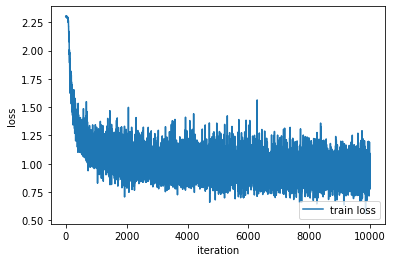

In [86]:
#markers = {'train': 'o', 'test': 's'}
x = np.array(range(10000))
#x = np.arange(len(train_acc_list))
#plt.plot(x, iteration, label='train acc')
plt.plot(x, train_loss_list, label='train loss')
plt.xlabel("iteration")
plt.ylabel("loss")
#plt.ylim(0, 9.0)
plt.legend(loc='lower right')
plt.show()

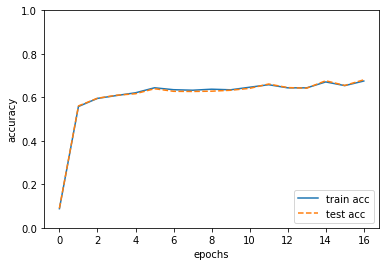

In [87]:
# グラフの描画
markers = {'train': 'o', 'test': 's'}
x = np.arange(len(train_acc_list))
plt.plot(x, train_acc_list, label='train acc')
plt.plot(x, test_acc_list, label='test acc', linestyle='--')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()

In [75]:
def mnist_make_noise(data, noise_percent, width=28, height=28):
    # mnist_make_noise(訓練データorテストデータ, ノイズ割合(%), 画像幅, 画像高さ)
    
    data_size = height * width # 画素数
    noise_num = int(0.01 * noise_percent * data_size) # ノイズを入れる画素数
    noise_data = data.copy()

    for each_data in noise_data:
        # ノイズを入れる配列のインデックスをノイズ割合分ランダムに決定
        noise_ind = np.random.randint(0, data_size, noise_num)
        
        # 生成したインデックスにランダム値を入れる
        for noise_idx in noise_ind:
            each_data[noise_idx] = np.random.random()            
    return noise_data

noise_x_train_list = []
noise_x_test_list = []
for i in range(1,26):
    noise_x_train_list.append(mnist_make_noise(x_train,i))
    noise_x_test_list.append(mnist_make_noise(x_test, i))
print("noise making done")


noise making done


'\nnoise_1_x_train=mnist_make_noise(x_train, 1)\nnoise_1_x_test=mnist_make_noise(x_test, 1)\nnoise_2_x_test=mnist_make_noise(x_test, 2)\nnoise_3_x_test=mnist_make_noise(x_test, 3)\nnoise_4_x_test=mnist_make_noise(x_test, 4)\nnoise_5_x_test=mnist_make_noise(x_test, 5)\nnoise_6_x_test=mnist_make_noise(x_test, 6)\nnoise_7_x_test=mnist_make_noise(x_test, 7)\nnoise_8_x_test=mnist_make_noise(x_test, 8)\nnoise_9_x_test=mnist_make_noise(x_test, 9)\nnoise_10_x_test=mnist_make_noise(x_test, 10)\nnoise_11_x_test=mnist_make_noise(x_test, 11)\nnoise_12_x_test=mnist_make_noise(x_test, 12)\nnoise_13_x_test=mnist_make_noise(x_test, 13)\nnoise_14_x_test=mnist_make_noise(x_test, 14)\nnoise_15_x_test=mnist_make_noise(x_test, 15)\nnoise_16_x_test=mnist_make_noise(x_test, 16)\nnoise_17_x_test=mnist_make_noise(x_test, 17)\nnoise_18_x_test=mnist_make_noise(x_test, 18)\nnoise_19_x_test=mnist_make_noise(x_test, 19)\nnoise_20_x_test=mnist_make_noise(x_test, 20)\nnoise_21_x_test=mnist_make_noise(x_test, 21)\nnoi

In [77]:
noise_x_train_list[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [36]:
dataset_dir = os.path.dirname(os.path.abspath("dataset"))
save_file = dataset_dir + "/mnist_noise_"

def save_mnist_noise(data, noise_percent):
    noise_dataset = {}
    noise_dataset["x_train"] = mnist_make_noise(data, noise_percent)
    with open(save_file+str(noise_percent)+"%.pkl", "rb") as f:
        pickle.dump(noise_dataset, f, -1)
        

In [70]:
dataset_dir = os.path.dirname(os.path.abspath("dataset"))
save_file = dataset_dir + "/mnist_noise_"
print(save_file)

/Users/tsukamotonaoto/Desktop/robot-intelligence/mnist_noise_


In [ ]:
'''
def make_noise(width=28, height=28):
    train_X, train_T, test_X, test_T = load_mnist()
    data_size = width*height

    noise_per_list = [i for i in range(1, 26)]
    for SAVE_DIR in ["../data/arr/train/train_X_noise", "../data/arr/test/test_X_noise"]:

        for noise_per in noise_per_list:
            noise_num = int(0.01*noise_per*data_size)

            if "train" in SAVE_DIR: noise_X = train_X.copy()
            elif "test" in SAVE_DIR: noise_X = test_X.copy()

            for each_X in noise_X:
                noise_mask = np.random.randint(0, data_size, noise_num)

                for noise_idx in noise_mask:
                    each_X[noise_idx] = np.random.random()

            save_dir = SAVE_DIR+str(noise_per)+"%.npy"

            np.save(save_dir, noise_X)
            print("noise {}% is written.".format(noise_per))

if __name__ == "__main__":
    make_noise()
'''

In [37]:
network = NeuralNet_3layer(input_size=784, hidden_size=40, output_size=10)

iters_num = 10000 # 初期値は10000
train_size = x_train.shape[0]
batch_size = 100
learning_rate = 0.1

train_loss_list = []
train_acc_list = []
test_acc_list = []

iter_per_epoch = max(train_size / batch_size, 1)

for i in range(iters_num):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = noise_1_x_train[batch_mask]
    t_batch = t_train[batch_mask]
    
    # 勾配
    #grad = network.numerical_gradient(x_batch, t_batch)
    grad = network.gradient(x_batch, t_batch)
    
    # 更新
    for key in ('W1', 'b1', 'W2', 'b2'):
        network.params[key] -= learning_rate * grad[key]
    
    loss = network.loss(x_batch, t_batch)
    train_loss_list.append(loss)
    
    if i % iter_per_epoch == 0:
        train_acc = network.accuracy(noise_1_x_train, t_train)
        test_acc = network.accuracy(noise_25_x_test, t_test)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)
        print(train_acc, test_acc)
        


0.09141666666666666 0.0924
0.9034833333333333 0.853
0.9222666666666667 0.8254
0.9340333333333334 0.8474
0.9422666666666667 0.8244
0.9500166666666666 0.8204
0.95355 0.85
0.9558833333333333 0.8286
0.96215 0.8478
0.9651333333333333 0.8224
0.9680833333333333 0.8321
0.9698833333333333 0.8193
0.9714333333333334 0.843
0.9732333333333333 0.8119
0.9741666666666666 0.8102
0.9760666666666666 0.8133
0.9775 0.8085


In [38]:
print(loss)

0.042275059445751884


In [52]:
class NeuralNet_4layer:

    def __init__(self, input_size, hidden_size, output_size, weight_init_value = 0.01):
        # 重みの初期化
        self.params = {}
        self.params['W1'] = weight_init_value * np.random.randn(input_size, hidden_size)
        self.params['b1'] = np.zeros(hidden_size)
        self.params['W2'] = weight_init_value * np.random.randn(hidden_size, hidden_size) 
        self.params['b2'] = np.zeros(hidden_size)
        self.params['W3'] = weight_init_value * np.random.randn(hidden_size, output_size) 
        self.params['b3'] = np.zeros(output_size)
        
        # レイヤの生成
        self.layers = OrderedDict()
        self.layers['Affine1'] = Linear_Layer(self.params['W1'], self.params['b1'])
        self.layers['Sigmoid1'] = Sigmoid_Layer()
        self.layers['Affine2'] = Linear_Layer(self.params['W2'], self.params['b2'])   
        self.layers['Sigmoid2'] = Sigmoid_Layer()
        self.layers['Affine3'] = Linear_Layer(self.params['W3'], self.params['b3'])        

        self.OutputLayer = Softmax_Loss_Layer(2)
        
    def predict(self, x):
        for layer in self.layers.values():
            x = layer.forward(x)
        
        return x
        
    # x:入力データ, t:教師データ
    def loss(self, x, t):
        y = self.predict(x)
        return self.OutputLayer.forward(y, t)
    
    def accuracy(self, x, t):
        y = self.predict(x)
        y = np.argmax(y, axis=1)
        if t.ndim != 1 : t = np.argmax(t, axis=1)
        
        accuracy = np.sum(y == t) / float(x.shape[0])
        return accuracy
        
    # x:入力データ, t:教師データ
    def numerical_gradient(self, x, t):
        loss_W = lambda W: self.loss(x, t)
        
        grads = {}
        grads['W1'] = numerical_gradient(loss_W, self.params['W1'])
        grads['b1'] = numerical_gradient(loss_W, self.params['b1'])
        grads['W2'] = numerical_gradient(loss_W, self.params['W2'])
        grads['b2'] = numerical_gradient(loss_W, self.params['b2'])
        grads['W3'] = numerical_gradient(loss_W, self.params['W3'])
        grads['b3'] = numerical_gradient(loss_W, self.params['b3'])
        
        return grads
        
    def gradient(self, x, t):
        # forward
        self.loss(x, t)

        # backward
        dout = 1
        dout = self.OutputLayer.backward(dout)
        
        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout)

        # 設定
        grads = {}
        grads['W1'], grads['b1'] = self.layers['Affine1'].W_grad, self.layers['Affine1'].b_grad
        grads['W2'], grads['b2'] = self.layers['Affine2'].W_grad, self.layers['Affine2'].b_grad
        grads['W3'], grads['b3'] = self.layers['Affine3'].W_grad, self.layers['Affine3'].b_grad
        

        
        return grads

In [55]:
# データの読み込み
(x_train, t_train), (x_test, t_test) = load_mnist(normalize=True, one_hot_label=True)

net = NeuralNet_4layer(input_size=784, hidden_size=100, output_size=10)

iters_num = 10000 # 初期値は10000
train_size = x_train.shape[0]
batch_size = 100
learning_rate = 0.1

train_loss_list = []
train_acc_list = []
test_acc_list = []

iter_per_epoch = max(train_size / batch_size, 1)

for i in range(iters_num):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = x_train[batch_mask]
    t_batch = t_train[batch_mask]
    
    # 勾配
    #grad = net.numerical_gradient(x_batch, t_batch)
    grad = net.gradient(x_batch, t_batch)
    print(grad)
    
    # 更新
    for key in ('W1', 'b1', 'W2', 'b2', 'W3', 'b3'):
        net.params[key] = net.params[key] - learning_rate * grad[key]
    
    loss = net.loss(x_batch, t_batch)
    train_loss_list.append(loss)
    
    if i % iter_per_epoch == 0:
        train_acc = net.accuracy(x_train, t_train)
        test_acc = net.accuracy(x_test, t_test)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)
        print(train_acc, test_acc)

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.17495848e-06, -2.54099908e-06, -6.60679306e-06,  4.65184170e-07,
        1.32285888e-06, -2.16672848e-06,  1.12456922e-05,  4.51629540e-06,
       -8.73366983e-07, -2.27776703e-06,  6.37248178e-06, -9.92198395e-07,
       -6.67257082e-07,  4.88643084e-06,  6.02467001e-06, -7.76504586e-07,
       -5.05660926e-06,  3.12643746e-06,  1.51459352e-06, -3.04070765e-06,
        3.31660616e-06,  2.23317520e-06,  2.87229299e-06, -4.66739911e-07,
       -5.41223308e-06,  8.24421246e-06, -5.01588841e-07, -1.30151115e-06,
       -4.23438324e-06,  8.81925079e-06, -3.95233747e-06,  8.44399634e-06,
       -2.87001588e-06, -8.10071795e-07,  1.28106027e-06,  6.64583059e-06,
        1.99650167e-06, -7.69458960e-06, -4.66598228e-06, -1.11371615e

0.0993 0.1032
{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-4.47292497e-06,  1.54665316e-06, -4.09792005e-06,  1.24946096e-06,
       -1.09646673e-06, -1.27327788e-07,  8.03660541e-06,  3.32092636e-06,
       -5.60199926e-07, -3.44567753e-06,  3.16849116e-06, -2.13385208e-06,
        3.28240605e-06,  1.37144354e-05,  3.97608018e-06,  3.64428541e-06,
       -1.12795232e-05,  4.17644911e-06,  4.05769855e-06, -5.77079286e-06,
        5.40815138e-06,  3.98263468e-07,  6.14215516e-06, -6.35671307e-06,
        3.91900899e-07, -2.23195034e-06,  2.30936197e-06, -1.74972148e-06,
       -7.60288962e-06,  5.63938840e-06, -6.79750821e-06,  3.74360644e-06,
       -7.54819882e-06,  7.58527276e-08, -4.72862166e-07,  5.38349572e-06,
        2.95378709e-06, -7.33195903e-06,  8.61553026e-07

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 3.79038221e-06,  6.20553002e-06,  2.15529691e-06,  1.54806216e-06,
       -9.37878029e-06,  4.27824443e-06, -1.17260502e-06, -1.10933813e-05,
        2.76767870e-06, -8.02216548e-06, -6.53101089e-06,  7.80726162e-07,
        1.77071504e-06,  1.04677065e-05,  7.97723391e-06, -2.18094293e-06,
       -1.11615389e-06, -4.99524798e-06,  1.27146412e-05,  1.91941103e-06,
       -2.75466136e-06,  1.31675348e-06,  6.80757796e-06, -5.76667755e-06,
        6.63625049e-06, -1.79744178e-05, -6.33038885e-06, -6.72935401e-06,
       -6.06188897e-06, -1.02500910e-05, -4.03710724e-07, -2.77926370e-06,
       -3.32755297e-06, -4.31012309e-06, -1.71679586e-06,  5.27003848e-06,
        5.96939494e-06, -1.17229510e-06,  8.38995478e-06,  7.34845739e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.63002495e-06,  6.83153600e-06,  1.13654785e-06, -5.17416698e-06,
       -2.94494470e-07,  1.81858000e-06, -6.88795254e-06, -6.03505842e-06,
        1.91690500e-06,  1.69541464e-06,  1.21387826e-07,  1.13114462e-06,
       -4.26519376e-06,  7.68699135e-07,  5.26407794e-07, -1.64161586e-06,
       -1.65748672e-06, -5.32723581e-06,  8.23213815e-07,  2.56967236e-06,
       -2.84742627e-07, -1.80333803e-06, -3.19319464e-06,  2.69329147e-08,
       -7.91162257e-07, -1.66492061e-06, -6.82978759e-07,  1.22382879e-06,
        2.07677581e-06, -1.75222740e-06, -1.36984661e-06,  1.27380164e-06,
       -1.37489677e-06,  4.34162165e-06,  7.55905485e-07, -1.26157427e-06,
       -9.32997653e-08,  1.29860198e-06,  1.22738316e-07,  2.81312279e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.04047860e-06,  1.11873201e-05,  6.98554194e-07, -8.62638700e-06,
       -1.71753576e-06,  2.39464196e-06, -1.05997853e-05, -3.93338427e-06,
        2.96784472e-06, -1.40672083e-06, -1.20476041e-06, -1.62121968e-06,
       -6.49877243e-07,  2.02835574e-06,  2.15536352e-06, -4.39847070e-06,
       -1.01414340e-05, -7.09631361e-06, -7.72638689e-07, -8.74107650e-07,
        5.21607709e-06, -1.54541138e-06, -2.52167305e-06, -1.62698326e-06,
       -1.37536496e-06, -2.15900367e-06, -3.43243440e-06,  2.79889052e-07,
       -1.79582307e-06, -5.58192536e-06, -3.35273235e-06,  1.17014705e-06,
       -5.53590986e-06,  5.50966937e-06,  3.47524446e-06, -1.87038977e-06,
       -1.91672869e-06, -1.94076439e-06,  1.08702332e-06, -8.75437104e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 4.59015758e-07, -2.18475408e-06, -2.01598218e-06,  5.85026139e-06,
       -1.21591508e-06,  3.45405556e-07,  4.82990530e-06, -2.00689450e-06,
        3.27863941e-06,  9.50666270e-08, -1.04836870e-06, -8.44551236e-07,
       -5.03612982e-07,  3.29652596e-06,  1.35090919e-06, -7.49440391e-07,
        8.80988100e-06,  5.16306439e-06,  5.64410851e-06,  1.88726522e-06,
       -3.03277108e-06, -2.27486870e-06,  5.88695418e-06, -1.75044823e-06,
        2.76075167e-06, -6.70388732e-06, -2.11093397e-06, -5.57001316e-06,
        1.92385725e-06, -7.73297612e-08,  4.67744944e-07, -7.30762985e-06,
        5.63861450e-06, -1.95080140e-06, -2.62458193e-06,  1.43938618e-06,
        1.28370509e-07,  4.30326984e-07,  2.17038881e-06,  6.48929681e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.33845504e-08,  2.82061210e-06, -5.83151247e-06,  2.00978467e-06,
       -8.42045380e-06,  3.85822605e-06, -3.19358800e-06,  1.70832491e-06,
        1.29499849e-05, -2.03061817e-06, -4.47131305e-06,  4.69294215e-08,
       -2.64713611e-07,  2.70729536e-07,  1.76183211e-06, -8.83578062e-06,
        2.17176532e-06, -4.31686854e-06,  9.82972164e-07, -5.48080021e-06,
        1.14020272e-05, -2.95510938e-06,  1.82419508e-05, -5.47044961e-06,
        7.82395263e-06,  3.62576204e-06, -1.70350182e-05, -7.43538546e-06,
        2.89513342e-06, -2.38204361e-06, -4.35352987e-07, -1.39461253e-07,
        3.34809276e-06,  8.28326962e-06,  4.37395326e-06,  3.14685708e-06,
       -4.64337321e-06, -8.05157699e-06, -3.12118449e-06,  4.62718417e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 3.49567106e-06,  3.41281237e-06,  2.76703245e-06, -9.95698692e-06,
        1.47571643e-06,  4.90295691e-06,  3.09662224e-06,  1.70395048e-06,
        9.48578838e-06,  7.08195445e-07, -4.52510930e-06,  6.45767747e-06,
       -3.36879619e-06,  3.39406207e-06,  4.85250748e-06,  6.04631214e-06,
        1.11794423e-05, -1.19491609e-05,  1.23370370e-05, -3.87114140e-06,
        4.35136900e-06, -6.01610380e-06,  9.28196195e-06,  4.52984971e-06,
        4.47624015e-06, -2.15557899e-06, -1.18578200e-05, -4.64395529e-06,
       -6.78844320e-06, -5.52777172e-06,  8.04610184e-06, -1.16896261e-05,
       -8.20659483e-07,  1.40738726e-06, -6.12872551e-06,  5.09041449e-07,
       -9.75060107e-07,  8.01731907e-06,  4.42512107e-06,  1.43460449e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.00082094e-05, -7.93899233e-06, -2.54455676e-07,  6.39590353e-06,
        5.73335942e-06, -9.47471717e-06,  6.64058722e-06,  3.06078728e-06,
       -1.31805923e-05, -2.62320067e-07,  6.50574933e-06, -1.30085662e-05,
        1.45983750e-05, -2.88258403e-07,  7.04764383e-07,  1.11444557e-06,
       -9.66219839e-06,  8.76828133e-06, -8.53478219e-06, -4.53178793e-06,
        2.38767548e-06,  6.76325711e-06, -1.04066999e-05, -5.20389653e-08,
       -6.73425783e-06, -5.13716993e-06,  1.10381703e-05,  7.26739570e-06,
       -6.14467731e-06,  6.13840403e-06, -4.13572408e-06,  6.17595490e-06,
       -5.29863617e-06, -1.33212652e-05,  1.95432995e-06, -1.36377530e-06,
        4.46748756e-06, -9.14512925e-06,  5.79272171e-06, -1.23874332e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-6.72469234e-06,  1.45153656e-06, -4.62753924e-06,  7.92941600e-06,
       -3.98090742e-06,  3.67360260e-07,  6.94973033e-06,  3.16736590e-07,
       -3.31164819e-06, -2.82449473e-06,  4.02598274e-06, -1.41004346e-06,
        1.84648063e-06,  1.97697917e-05, -6.60428504e-07,  5.91670064e-06,
       -1.62389545e-05,  1.10581955e-05,  2.54504833e-06, -3.24722687e-06,
        1.42436198e-06,  8.41280338e-07,  6.43487043e-06, -1.28173278e-05,
        3.63064096e-06, -5.64816621e-06,  1.07192941e-05, -3.95781484e-07,
       -3.36475826e-06,  9.73292052e-06, -1.24098832e-05,  7.63818837e-06,
       -8.05974800e-06,  2.91674173e-06, -4.78800872e-07,  6.37598425e-06,
        4.99909381e-06, -8.79708426e-06, -5.05134237e-07, -6.45224662e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.43400471e-06, -3.59311268e-06,  6.87609443e-08,  9.89770981e-06,
       -5.37931966e-06, -2.37028740e-06,  4.86960104e-06, -3.93981416e-06,
       -5.54688217e-06, -3.94241563e-06, -2.04782304e-07, -5.68621692e-06,
        1.02854708e-05,  1.03537160e-05,  1.92713159e-06,  2.34423261e-06,
       -7.83912740e-06,  3.81422066e-06,  1.66437244e-06, -4.19512115e-06,
        2.21729018e-06,  4.98654368e-06,  4.75259159e-06, -8.45261467e-06,
        5.74198097e-06, -1.32344511e-05,  3.87084949e-06,  1.47066848e-06,
       -5.61128157e-06,  2.21896454e-06, -4.83809878e-06,  6.51654471e-06,
       -6.21029387e-06, -7.77044003e-06,  3.80808926e-08,  4.51571836e-06,
        7.81288589e-06, -9.28442352e-06,  7.24974548e-06, -1.28771157e

       -0.01478546,  0.00153378, -0.00995003,  0.010351  ,  0.01230669])}
{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.95518579e-06, -9.65508221e-07,  8.33215263e-07,  6.06320928e-06,
       -2.67056178e-07, -4.07198484e-06,  1.51222348e-05, -5.92971486e-07,
       -1.67103433e-05, -9.82289516e-06,  5.42221846e-06, -6.59097769e-06,
        1.26869114e-05,  2.53692810e-05,  6.97935276e-06,  1.23373475e-05,
       -2.57580585e-05,  1.19090050e-05,  7.16710964e-06, -4.44604224e-06,
       -3.35078054e-06,  8.07751610e-06, -5.52546877e-06, -1.00294346e-05,
       -2.63694114e-06, -1.79605720e-05,  2.00259610e-05,  3.05914616e-06,
       -1.89653566e-05,  5.77582548e-06, -1.17142366e-05,  8.36913702e-06,
       -1.83971355e-05, -1.42080148e-05, -3.71183000e-06,  8.12582004e-

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-8.01126213e-06, -6.54651479e-06, -3.38452618e-07,  6.88225008e-06,
        3.01833533e-06, -1.90945243e-06,  3.71797113e-06,  8.50350788e-06,
       -3.98191652e-06,  4.68317563e-06,  2.60208033e-06, -3.52115738e-07,
        2.96836793e-06,  3.72178022e-06, -1.00124557e-05,  9.17666987e-06,
       -4.19263234e-06,  1.03074652e-05, -6.74712695e-06, -4.16191378e-06,
        1.72170916e-06, -1.07240169e-06,  1.84581965e-06, -4.42542550e-06,
        3.57956195e-06,  3.40078438e-06,  1.14947781e-05,  4.88050245e-06,
        2.29031478e-06,  9.50775642e-06, -3.75285707e-06,  6.27352928e-07,
       -1.13951438e-06,  2.63712026e-06, -1.73070433e-06, -2.31116122e-06,
       -9.87586554e-07, -2.47301326e-07, -2.21058794e-06, -1.25776390e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-3.08343032e-06, -4.68229822e-06, -7.50808547e-06,  1.04477371e-06,
        4.82605477e-06, -3.13214694e-06,  1.48440198e-05,  1.08921501e-05,
       -1.49342003e-06, -1.21210767e-06,  7.60665625e-06, -2.03396726e-06,
        8.54108890e-07,  6.03441262e-06,  3.77829924e-06,  2.54770657e-06,
       -5.73104246e-06,  8.74164315e-06,  2.93854262e-07, -5.14211148e-06,
        4.13608295e-06,  4.80892755e-07,  3.03225078e-06, -1.82087650e-07,
       -6.54782378e-06,  1.02381787e-05,  2.91191926e-06, -1.84699286e-06,
       -5.48051001e-06,  1.11777326e-05, -4.50222689e-06,  3.60675132e-06,
       -2.43978006e-06, -7.73130042e-07, -1.56897062e-07,  5.02315186e-06,
       -4.07175266e-07, -6.32978905e-06, -5.24425920e-06, -1.24950798e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-4.93670453e-07, -1.63632584e-06, -1.51125876e-06,  3.12850510e-06,
       -3.10924190e-06, -1.22876513e-06,  5.05951600e-06, -8.02121022e-06,
       -2.26388366e-06, -1.36685037e-06,  2.85785713e-06,  1.64193187e-07,
       -8.42368803e-07,  3.89059822e-06,  6.03049140e-06, -1.38151135e-06,
        9.20968662e-07, -3.73434360e-06,  4.21308428e-06,  1.43886724e-06,
       -1.56240261e-06,  4.17347377e-06,  1.10204566e-06, -1.37349060e-06,
       -1.13721038e-07, -2.83456528e-06, -1.40689751e-06,  1.32297227e-06,
       -1.15871403e-06,  4.30327658e-06, -1.36843453e-06,  1.11024789e-05,
       -2.06434834e-06, -4.02546279e-06,  2.73823129e-07,  6.50628868e-06,
        7.43175534e-06, -5.88985271e-06,  1.04076745e-06, -1.56974504e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.08468250e-06, -4.68256814e-06, -8.16734771e-06,  4.86339999e-06,
       -3.59848646e-06,  4.31075614e-07,  7.37701118e-06,  6.85191774e-06,
        7.93453518e-06, -2.16298365e-06,  2.66897037e-07,  3.20920536e-07,
       -1.30617905e-06, -2.35507494e-06,  3.01966499e-06, -7.03637062e-06,
        5.50467907e-06,  2.96148863e-06,  4.47027020e-07, -3.50237524e-06,
        6.02609834e-06, -6.06697014e-07,  1.37874188e-05, -1.26031635e-06,
        1.29168758e-06,  1.04752359e-05, -1.16720384e-05, -7.37633650e-06,
        2.21260954e-06,  3.63356267e-06,  5.36244641e-07,  1.27350543e-06,
        6.21028983e-06,  3.21141135e-06,  2.85710818e-06,  5.16732991e-06,
       -3.81937139e-06, -7.11300767e-06, -6.79089495e-06, -3.33195715e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.87281020e-06,  1.64652932e-06,  1.42635288e-06, -6.53441174e-06,
        6.78193755e-06, -3.35588259e-06, -1.17673523e-06,  2.52306026e-06,
       -6.43011361e-06,  5.27969325e-06,  6.93876286e-06, -2.42537743e-06,
        2.48171762e-06,  2.84592433e-06, -2.66606969e-06,  7.14589474e-06,
       -1.23264194e-05, -3.60600028e-06, -7.08090025e-06, -5.37730243e-06,
        6.73860875e-06,  9.30614820e-07, -8.44386611e-06,  6.93450025e-07,
       -4.44213901e-06,  5.26225636e-06,  9.08319990e-06,  1.12200941e-05,
       -3.66393166e-06,  9.01780599e-06, -4.42349736e-06,  1.03735880e-05,
       -1.02727734e-05,  1.82557603e-06,  8.22580310e-07, -2.30542385e-06,
        2.25263144e-06, -3.08815739e-06, -9.97427063e-08, -6.43956969e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 5.08896407e-06, -2.52272984e-06,  1.17295442e-05, -1.07040890e-05,
        2.15046818e-06, -4.46845130e-07, -7.66982296e-06, -3.22973382e-06,
       -6.21391506e-06, -3.11624126e-07, -5.04982495e-06,  4.86406591e-06,
        2.25417458e-06, -1.65261348e-05,  1.00462167e-06,  2.42456138e-06,
        5.75724029e-06, -1.91412500e-05, -2.55414338e-06,  1.29385876e-06,
       -2.58414243e-06,  5.88072966e-06, -1.23400187e-05,  1.23759025e-05,
       -1.72653765e-06,  2.34281003e-06, -3.81017407e-06,  8.99245312e-06,
       -4.94281640e-06, -1.08620922e-05,  1.33520381e-05,  4.06353080e-06,
       -3.56945683e-06, -8.54791273e-06, -6.60823958e-07, -4.25724687e-06,
        3.48925798e-06,  9.75786069e-06,  4.58709395e-06,  2.54407943e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.51105716e-06,  4.89399900e-06,  4.66047092e-06, -1.07124132e-05,
        2.36530675e-06,  2.86280846e-08, -4.98647518e-06, -2.04792553e-06,
       -1.85854287e-06,  4.53025455e-06,  2.42302383e-06,  1.02782941e-06,
        2.59025511e-06,  4.55705160e-06, -1.37526212e-07,  8.36317622e-06,
       -1.00819650e-05, -1.62569563e-05, -2.17936596e-06, -8.40149874e-06,
        1.16410841e-05,  5.90730961e-07, -1.91721248e-06,  8.32005899e-09,
        2.18552297e-06,  1.40347847e-06,  2.17198975e-07,  1.16397006e-05,
       -6.73668556e-06,  4.37956110e-06, -8.26299919e-07,  1.21076056e-05,
       -1.39547376e-05,  3.07222488e-06,  7.56208375e-08, -6.95296031e-07,
        4.89273284e-06, -2.79366965e-06,  3.80454995e-06,  2.29366619e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.83122508e-07, -3.06310376e-06,  6.73902048e-06, -5.93834672e-06,
        9.18564485e-06, -4.41230822e-06, -2.00825926e-06,  6.56127751e-06,
       -1.16058483e-05,  3.93774426e-07,  1.37264025e-06, -2.89279810e-06,
        5.94495736e-06, -8.94737176e-06, -3.62559684e-06,  5.27082247e-06,
       -6.09689224e-06,  2.10762224e-06, -7.98912790e-06,  5.21503575e-07,
       -4.21269498e-06,  3.33965961e-06, -1.81737412e-05,  8.10893374e-06,
       -8.77819476e-06,  2.08920323e-06,  1.19579259e-05,  7.60352690e-06,
       -5.26008699e-06, -3.54562504e-06,  3.50196042e-06, -3.25146591e-06,
       -3.86428968e-06, -7.97709662e-06, -8.35361340e-07, -7.51240064e-06,
       -1.16942958e-06,  7.57297686e-06,  2.42501198e-06, -8.56076931e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 3.64130849e-06, -1.90882399e-07,  5.83970566e-06,  4.52192517e-06,
       -9.07600529e-06,  4.04843309e-06, -3.70655858e-07, -1.08429537e-05,
       -1.66545100e-06, -5.16111685e-06, -6.79458779e-06,  6.40793699e-06,
       -5.50035420e-07,  6.30852961e-06,  2.36518533e-06,  3.86307253e-06,
        3.17052147e-06, -5.97685325e-06,  9.87288895e-06,  3.90354818e-06,
       -7.67791183e-06,  3.62030297e-06,  4.44611318e-06, -4.04580814e-06,
        9.41824926e-06, -1.35543696e-05, -7.53082358e-07, -1.23148606e-06,
       -2.66656567e-06, -6.80286821e-06,  2.99352606e-06,  2.52469786e-06,
       -2.38873535e-06, -4.87328710e-06, -3.65814055e-06,  4.99161533e-06,
        8.63752356e-06,  3.49936085e-06,  6.10366870e-06,  8.76699697e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.28342120e-07,  1.45810709e-06, -1.12880823e-05, -4.46522619e-06,
        2.32852412e-06,  2.62629032e-06,  6.76752914e-06,  9.73374763e-06,
        1.45247558e-05,  5.43598638e-06,  5.55979723e-06,  4.69294848e-06,
       -1.12006716e-05,  1.41446372e-06,  1.21658932e-06, -2.87054099e-06,
        6.11320858e-06, -8.23227614e-07,  1.07744944e-06, -5.16770711e-06,
        1.12032923e-05, -7.88797344e-06,  1.52347864e-05,  4.23738914e-07,
       -1.23416772e-06,  2.11910731e-05, -1.20776176e-05, -5.64011418e-06,
        5.42997676e-06,  1.21459687e-05, -2.09022256e-06,  1.30692632e-06,
        5.12879236e-06,  1.54913190e-05,  1.52108439e-06,  4.01347200e-06,
       -7.85896776e-06, -4.77409436e-06, -1.27897497e-05, -2.53528596e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 4.53386287e-07,  3.43356329e-06,  7.07410885e-07, -1.26756798e-05,
        5.68717139e-06, -3.66185660e-07,  2.94147331e-06, -5.10269896e-06,
        2.10284716e-06,  5.07199066e-06,  5.45596712e-06,  3.40262124e-06,
       -6.05061558e-06, -1.51385520e-07,  7.62179578e-06,  2.96330495e-06,
        5.48277588e-06, -1.63994086e-05,  5.45528064e-06, -1.52034524e-06,
        4.43533955e-06, -1.02622137e-06, -3.28152605e-06,  7.72775713e-06,
       -5.09045324e-06,  5.69273259e-06, -6.28096278e-06,  5.22821775e-06,
       -3.92351241e-06,  5.25172404e-06,  3.68595788e-06,  7.73795903e-06,
       -4.84518161e-06,  6.05113541e-07, -1.98677298e-06,  2.50428660e-06,
        4.21589404e-06,  6.18712181e-07,  5.71069796e-07,  3.32588994e

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.01070148e-05, -4.70232161e-06, -5.28758730e-06,  8.57100101e-07,
        1.71873706e-05, -7.76250220e-06,  1.93345664e-05,  7.87665291e-06,
       -3.92746863e-06,  8.15849679e-06,  1.26460312e-05, -1.04154159e-05,
        4.30935423e-06,  1.22816233e-05,  2.40416661e-06,  1.07127425e-05,
        4.05694877e-06,  1.62731462e-05,  4.44537670e-06, -4.06604295e-06,
        8.71031168e-07, -6.42599757e-06, -5.28552956e-06,  2.77696861e-06,
       -1.01728934e-05, -5.76845348e-06,  1.28985227e-05,  1.76307005e-07,
       -5.92238498e-06,  1.52945329e-05, -5.10544540e-06, -1.33779946e-05,
        1.42733375e-08, -7.15877735e-06, -7.78403833e-06, -2.20037114e-06,
       -1.14165311e-07, -5.23360256e-07,  5.50760762e-06, -1.24892035e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-3.79028131e-06, -3.56276881e-06, -2.50066483e-07,  2.47991529e-07,
        7.72803476e-06, -4.98979773e-06,  1.30817038e-06,  8.54505478e-06,
       -5.79510247e-06,  1.79409420e-06,  3.39009803e-06, -7.10789434e-06,
        6.33340594e-06, -4.85028709e-06, -3.67446683e-06,  8.15713977e-07,
       -4.33957697e-06,  9.38946967e-06, -8.26810810e-06, -1.83641463e-06,
        7.26570306e-07,  1.26137459e-07, -8.99088750e-06,  3.07668142e-06,
       -6.95166515e-06,  2.48330065e-06,  8.13688908e-06,  2.66006012e-06,
       -1.26526031e-06,  1.72981720e-06, -1.18472787e-06, -5.35624280e-06,
        5.11826199e-07, -3.94409646e-06,  8.34747343e-07, -5.83113542e-06,
       -4.20881782e-06,  3.69696541e-07,  2.49483612e-07, -7.70056904e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-6.62746440e-06,  3.33747917e-06,  5.14541244e-06, -4.50800928e-06,
       -4.78965877e-07, -1.91626403e-06, -5.76480270e-06, -3.31627010e-06,
       -9.16801877e-06, -1.02870788e-06,  1.69613267e-06, -2.86046733e-06,
        7.47369786e-06,  4.39915709e-06, -3.19058738e-07,  5.05822760e-06,
       -1.82449601e-05, -7.94896298e-06, -5.37547010e-06, -5.13443554e-06,
        5.71700249e-06,  5.68203163e-06, -7.91265358e-06, -2.85709626e-06,
       -3.13396117e-08, -3.80821678e-06,  7.35542303e-06,  1.11350358e-05,
       -7.62026441e-06,  1.06760738e-06, -4.10786328e-06,  1.42205391e-05,
       -1.46087890e-05, -2.74697985e-06,  2.41284232e-06, -3.06299389e-07,
        6.65546007e-06, -5.22439648e-06,  4.83493395e-06, -6.64860291e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-6.64031586e-06,  3.80686400e-06,  2.42444919e-07, -2.24400190e-06,
       -1.32446184e-06,  2.95311418e-06,  7.48743975e-06,  1.37498110e-06,
       -2.24486629e-06, -8.73196116e-07,  3.13154575e-06,  5.08938557e-06,
       -3.72161976e-07,  2.24333360e-05,  5.92744282e-07,  1.52808247e-05,
       -1.55970748e-05, -1.48211843e-06,  7.45763672e-06, -7.28107096e-06,
        5.10595550e-06, -6.74593938e-07,  7.16830746e-06, -9.04708962e-06,
        5.70322442e-06, -3.42327506e-06,  8.55676890e-06,  3.90981338e-06,
       -9.97720411e-06,  9.47618919e-06, -7.80558348e-06,  8.65775157e-06,
       -1.51935608e-05,  4.30154141e-06, -4.47369251e-06,  6.53529885e-06,
        7.54350714e-06, -2.99199435e-06,  1.82168226e-06, -5.30136922e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-5.21308061e-06, -2.55325388e-06,  1.27405332e-06, -5.66566454e-06,
        6.13470873e-06, -3.69636201e-06,  3.19058699e-07,  9.75026633e-06,
       -2.44186983e-06,  1.32415827e-06,  1.44518226e-06, -5.31620594e-06,
        8.64176133e-06, -5.67271641e-06, -6.90831961e-07,  1.92701720e-06,
       -4.95966328e-06, -2.93728295e-06, -7.03074089e-06, -8.35498797e-06,
        9.78031173e-06,  8.21682831e-07, -3.27163803e-06,  4.51401586e-06,
       -3.68831768e-06,  5.48085703e-06, -1.09426596e-06,  4.78005865e-06,
       -6.56529514e-06,  1.51626477e-07,  2.47995814e-06, -8.94160999e-07,
       -4.75158685e-06, -3.36542794e-06,  1.53417096e-06, -4.32444864e-06,
       -2.88287117e-06, -1.90788256e-06,  1.99387124e-06, -5.05635563e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.28130828e-06,  3.50045691e-06, -8.88913707e-07, -1.02367708e-06,
        5.52974891e-06, -2.26469538e-06,  4.62202998e-06, -3.27291829e-07,
       -4.70589385e-06,  2.66645381e-06,  6.33083965e-06, -4.73571410e-06,
        2.58904601e-06,  1.42687700e-05,  1.91643494e-07,  8.13900636e-06,
       -1.03899959e-05,  6.36356209e-06,  2.02186367e-06, -2.68619486e-06,
        1.43066222e-06, -2.13830681e-06, -4.35400403e-06, -4.33070499e-06,
       -2.84794675e-06, -7.77750655e-06,  1.19444936e-05,  3.42495338e-06,
       -5.12955315e-06,  7.82609167e-06, -8.20555199e-06, -3.00024044e-07,
       -7.85197158e-06, -5.79170896e-07, -2.99564599e-06, -1.84929554e-07,
        3.18863806e-06, -2.55623557e-06,  4.28832789e-06, -1.84881018e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-6.09698840e-06,  2.29997130e-06, -9.54275976e-07, -6.61109635e-06,
        6.26528344e-06, -3.73567863e-06, -2.23540621e-06,  1.10515492e-07,
        4.97278256e-06,  5.46627086e-06,  2.20130061e-06, -9.73319231e-06,
        6.76687133e-06, -4.51527308e-06,  4.02460546e-06, -4.16590567e-06,
        5.56405824e-06, -7.78898572e-06, -1.84640636e-06, -6.81521477e-06,
        1.24578439e-05, -3.65339033e-06,  7.63403152e-08,  4.81197339e-06,
       -2.93311256e-06, -3.08598007e-06, -1.00541526e-05,  1.56194010e-06,
       -2.62620949e-06, -5.70905659e-07,  2.61545250e-06, -5.77607897e-06,
        5.86851627e-09, -2.44929290e-06,  1.30998176e-06, -4.80884827e-06,
       -3.01878473e-06, -4.73586863e-06,  6.58510444e-06,  6.32492420e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.15659320e-06,  4.32725416e-07, -7.36683221e-06,  3.32412874e-06,
        2.20374996e-06, -2.20490741e-07,  1.07864480e-05,  6.25400292e-06,
        7.73196743e-06, -1.76629279e-06,  9.94647446e-07, -5.92984238e-06,
        2.46077363e-06,  9.23595445e-06,  5.21074624e-06, -1.98497744e-06,
        4.95130436e-06,  1.14627141e-05,  8.29086970e-06, -3.28050506e-06,
        3.42933385e-06, -6.26155478e-06,  1.05575774e-05, -2.69643926e-06,
       -9.05253843e-07, -6.13201400e-06, -5.16680005e-06, -1.18675869e-05,
       -3.56357460e-06,  7.61416206e-07, -2.62535994e-06, -1.64106665e-05,
        4.95580544e-06, -1.07559579e-06, -2.73808055e-06,  1.61941596e-06,
       -4.62879435e-06, -2.94275868e-06,  2.50931518e-06,  3.03382199e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-5.75784537e-06, -3.47722890e-06,  3.65278932e-06, -6.45938178e-07,
        1.11955078e-05, -5.85843391e-06,  8.63999928e-06,  7.98884082e-08,
       -1.00255361e-05,  3.71850601e-06,  5.80099134e-06, -6.57092444e-06,
        6.39974265e-06,  5.80603314e-06,  1.03613762e-06,  1.03069870e-05,
        4.55409575e-07,  6.75226534e-06,  2.57143333e-06, -3.19863480e-08,
       -4.97158477e-06, -1.73319650e-07, -1.26601020e-05,  3.85850609e-06,
       -6.64177147e-06, -1.14799026e-05,  1.41248786e-05,  5.01749550e-06,
       -7.17822064e-06,  4.26005315e-06, -5.33071445e-07, -7.39993275e-06,
       -3.81279972e-06, -1.16134026e-05, -6.46229102e-06, -3.55362632e-06,
        4.43263823e-06,  4.16279638e-06,  9.28667709e-06,  6.30962125e

0.0993 0.1032
{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 2.07126550e-06,  2.90259952e-06, -3.13444054e-07, -3.65026089e-06,
        5.29111946e-06, -9.12514566e-07,  6.82698510e-06, -1.09991451e-05,
       -2.16735925e-06,  4.05202489e-06,  6.92240937e-06,  2.16631369e-06,
       -8.60520562e-06,  7.52236233e-06,  6.62470531e-06,  4.02346599e-06,
        6.86121022e-06, -2.17415679e-06,  9.98511510e-06,  6.97377204e-06,
       -8.57515907e-06, -1.50315701e-06, -7.56360766e-06,  3.40548179e-06,
       -6.15830078e-06, -5.47787150e-06,  5.26197441e-06,  1.35327845e-06,
       -3.35966717e-08,  6.64419848e-06, -1.42056224e-06,  2.18489821e-06,
       -3.45941847e-07, -2.48860528e-06, -5.17595246e-06,  3.48452523e-06,
        6.64879543e-06,  3.18004289e-06,  2.09012621e-06

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.19207101e-06,  4.03635566e-07, -2.59152017e-06,  1.12740518e-06,
       -5.58354207e-06,  1.94595052e-06,  1.81535066e-06,  6.88656667e-07,
        1.28261773e-06, -2.72618351e-06,  4.53387379e-07,  3.56388438e-06,
       -1.24618289e-06,  5.30822398e-06,  1.24995640e-06,  4.10816864e-07,
       -7.69471380e-06, -3.32104178e-06,  3.17442986e-07, -3.59811950e-06,
        4.88750267e-06,  2.44984539e-06,  7.71870840e-06, -5.02892350e-06,
        3.65671206e-06,  5.53999722e-06, -2.63941828e-06,  6.49425388e-07,
       -1.72815770e-06,  4.25243889e-06, -3.33985056e-06,  1.17359784e-05,
       -5.13422987e-06,  4.31281910e-06,  2.25227340e-06,  5.94232322e-06,
        2.79307571e-06, -6.39181661e-06, -4.00230051e-06, -4.70503804e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 2.28362807e-06,  9.46613680e-08, -4.02542897e-06,  1.40870110e-05,
       -1.20589203e-05,  5.25262900e-06, -1.73716606e-06,  8.38802665e-06,
        2.64138900e-06, -1.02568758e-05, -8.13624729e-06,  1.38886271e-06,
        2.48985291e-06,  8.56973056e-06, -7.39743332e-06, -2.84213939e-06,
       -1.27116418e-05,  1.97942160e-05, -1.36597100e-06,  3.79894925e-07,
       -3.26152606e-06, -3.26005857e-07,  1.34959616e-05, -1.45129157e-05,
        9.47266628e-06, -3.50189925e-06,  4.36897874e-06, -1.14385772e-05,
        2.72669035e-06, -6.04478972e-06, -7.63937536e-06, -7.57637496e-06,
        3.04395246e-06,  6.35655898e-06,  2.55733619e-06,  2.06401668e-06,
       -5.69526634e-06, -2.17922465e-06, -5.01889117e-06, -5.77918633e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-8.21325781e-06,  1.75463676e-06, -1.11884069e-05,  4.81924394e-07,
        7.21987610e-06, -3.20927865e-06,  6.14943780e-06,  1.10130521e-05,
        6.94735947e-06,  5.53786992e-06,  8.34389827e-06, -9.25967718e-06,
        1.33757355e-06,  6.18195741e-06, -7.61153186e-07, -2.82924699e-06,
       -4.01365774e-06,  1.22549348e-05, -4.37420928e-06, -7.40582587e-06,
        1.22236136e-05, -7.59864531e-06,  6.54430206e-06, -3.35794187e-06,
       -5.21440846e-06,  7.27400093e-06, -6.48805366e-07, -3.95846931e-06,
        1.96235258e-06,  1.19224446e-05, -8.80060529e-06, -6.17255410e-06,
        2.28574791e-06,  7.89152398e-06,  2.18837736e-06, -1.66033622e-06,
       -8.47563057e-06, -9.39492844e-06, -4.50926581e-06, -4.61918745e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-1.20185521e-05, -1.69764186e-06, -7.69742444e-06, -1.63395840e-07,
        6.73717400e-06, -5.24364736e-06,  1.66080601e-05,  6.93446428e-06,
       -1.61459657e-06,  1.89627868e-06,  1.09367532e-05, -8.23174706e-06,
        6.84478588e-06,  1.63682580e-05,  6.65577189e-06,  6.60544617e-06,
       -1.01880340e-05,  5.12141140e-06,  2.89692771e-06, -1.15329328e-05,
        1.25249868e-05, -8.97219322e-07,  5.34841310e-06, -3.98120476e-06,
       -4.52219829e-06,  4.25665778e-07,  3.26923807e-06,  1.87353019e-06,
       -1.08124886e-05,  1.60543086e-05, -8.58228918e-06,  5.81879972e-06,
       -9.80289728e-06, -2.69096604e-06, -1.42509222e-06,  5.62369691e-06,
        3.99904145e-06, -1.30113340e-05,  2.43390496e-06, -7.69475765e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.49385880e-06,  4.98359503e-06,  5.85904925e-06, -1.16443688e-05,
        7.17102872e-06, -3.46730370e-07, -9.42638293e-06, -1.59887756e-06,
        1.26566480e-06,  5.18376246e-06, -1.36735330e-06, -1.44091092e-06,
       -1.73556593e-07, -9.26272712e-06, -9.58408134e-07,  1.78518170e-07,
        5.78715604e-06, -9.36572205e-06, -1.95940952e-06,  9.22734028e-07,
        1.26655113e-06, -3.72771045e-06, -1.01097958e-05,  8.72777432e-06,
       -4.06897975e-06, -1.59170262e-06, -2.36499881e-06,  3.71776993e-06,
       -1.46797865e-07, -7.15909880e-06,  6.13308418e-06, -9.20334512e-06,
        5.86261974e-07, -3.91511334e-07, -1.13561849e-06, -8.71808778e-06,
       -3.94073277e-06,  8.42931552e-06,  4.50587629e-06,  7.50135861e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-7.06832426e-06, -4.58709791e-06,  9.98679668e-07,  1.43261525e-05,
        7.95357434e-06, -9.02802996e-06,  3.62499356e-06, -5.44248513e-06,
       -1.41330698e-05,  2.16699381e-06,  5.12695546e-06, -1.65125171e-05,
        1.10274808e-05,  4.98591529e-06, -3.82256870e-06,  8.83266676e-07,
       -1.20655835e-06,  2.58919872e-05, -3.40844220e-06,  7.76910798e-06,
       -1.40168084e-05,  8.34719262e-07, -1.77504640e-05, -3.07301561e-06,
       -7.23097777e-06, -2.43613424e-05,  2.32280613e-05,  6.93428256e-07,
        2.42958945e-06,  1.47947648e-06, -7.73824040e-06, -1.38301840e-05,
        5.05689482e-06, -1.49473372e-05, -3.15332216e-06, -7.15702196e-06,
        2.09324789e-06,  2.03444929e-07,  1.10047741e-05, -2.01202843e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 5.16430479e-08, -2.26228484e-06,  8.47862474e-07, -3.47409310e-06,
        2.80300964e-06, -1.79238021e-06,  7.62761031e-07, -9.54762125e-07,
       -6.02267642e-08,  2.61787595e-06,  1.64560440e-06,  2.40434360e-08,
       -3.65724478e-07, -6.39339800e-06,  2.16882674e-06, -9.01779776e-07,
        5.86164498e-06, -6.93066726e-06, -1.01365200e-06, -5.96588988e-07,
        1.89080585e-06,  1.05350484e-06, -2.51204937e-06,  5.50964555e-06,
       -2.56738045e-06,  4.21474909e-06, -4.11488229e-06,  3.07132454e-06,
       -9.13236900e-08,  1.24444632e-06,  4.09599088e-06,  3.32856632e-06,
        6.91063236e-07, -2.31500403e-06,  2.33798380e-07, -3.27299915e-07,
        9.33496726e-07,  9.92186921e-08,  8.23871200e-08,  8.47454507e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-2.45229540e-06, -1.70900305e-06, -5.68985289e-06, -4.69592711e-06,
        5.60778827e-06, -6.80134646e-07,  1.22490221e-05,  5.08255255e-06,
       -3.97022146e-07,  4.63927212e-06,  1.04806340e-05,  6.29306459e-06,
       -9.11682352e-06,  7.56448050e-06,  2.12972678e-06,  7.97030461e-06,
       -3.49722497e-06, -1.29656052e-06,  1.75840556e-06, -3.02613134e-06,
        3.26908732e-06, -8.24980321e-07,  1.71932826e-06,  1.19598030e-06,
       -5.23042983e-06,  1.68051430e-05,  4.28038805e-06,  4.53371761e-06,
       -1.51544667e-06,  1.77945766e-05, -4.25296640e-06,  1.37849287e-05,
       -5.28206979e-06,  6.63572275e-06, -1.76129097e-06,  6.68919580e-06,
        3.02494218e-06, -3.14405536e-06, -9.16775538e-06, -7.90242693e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-3.20138228e-06,  3.57576738e-06, -5.45620515e-06, -6.95427365e-06,
       -7.77448111e-07,  7.71101746e-07,  5.14404718e-06, -8.30465915e-07,
        7.06608817e-06,  1.45782927e-06,  4.78650452e-06,  1.14587144e-06,
       -2.75124794e-06,  6.14386420e-06,  8.33027213e-06, -9.81730163e-07,
       -1.91097264e-06, -1.26528951e-05,  4.48184560e-06, -7.69465577e-06,
        1.32071881e-05, -8.98126813e-07,  1.00088885e-05, -5.16696864e-07,
        7.43495412e-09,  7.93647151e-06, -1.20121504e-05,  8.48746558e-07,
       -4.65885935e-06,  8.19896414e-06, -1.83588549e-06,  1.20806226e-05,
       -6.38245230e-06,  5.11700429e-06,  1.75861123e-06,  7.04866994e-06,
        2.88221096e-06, -9.79747378e-06, -2.25109827e-06, -5.77245211e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 1.76078409e-06,  2.26196560e-06,  5.74098548e-06, -1.45298125e-06,
       -6.59015839e-06,  2.33758060e-06, -7.76892259e-06, -8.42931683e-06,
       -1.48656762e-06, -2.76694952e-06, -5.19815156e-06,  3.20783109e-06,
        1.22287162e-06, -1.86481544e-06,  9.66597531e-07, -6.06701629e-07,
       -1.89996842e-06, -1.15015505e-05,  1.05330575e-06,  9.41088918e-07,
       -5.13332039e-07,  4.08083352e-06, -3.63123770e-07, -1.02112126e-06,
        5.49073883e-06, -5.62731949e-06, -3.53754534e-06,  3.44162707e-06,
       -1.44711326e-06, -6.95290307e-06,  2.92757295e-06,  7.33602316e-06,
       -4.32797230e-06, -1.78403696e-06,  1.14630278e-06,  1.13404362e-06,
        5.05849734e-06,  4.24645359e-07,  3.78019619e-06,  3.88782844e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 3.15000382e-07,  7.57524973e-07, -2.69077841e-06, -3.19225003e-06,
       -1.30502663e-06,  2.31154600e-06,  6.25296811e-06,  1.20503030e-06,
        4.87734802e-06, -3.39880459e-07,  1.31867048e-06,  4.75402316e-06,
       -3.96241345e-06,  5.87691290e-06,  4.47093272e-06,  2.72765219e-06,
        1.23988686e-06, -5.89942627e-06,  6.32751954e-06, -3.62084753e-06,
        4.74488975e-06, -1.23550573e-06,  8.74905477e-06, -6.02555956e-07,
        1.95278947e-06,  4.93270482e-06, -6.28270215e-06, -1.70314548e-06,
       -3.51836006e-06,  4.42914452e-06,  3.17435337e-07,  4.34240293e-06,
       -2.89186414e-06,  3.36392671e-06, -1.44633540e-06,  5.62023490e-06,
        2.00474381e-06, -2.18174933e-06, -2.16984597e-06,  1.45463784e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-5.75730901e-06, -5.96511374e-06, -3.13737756e-06,  1.23150437e-05,
       -1.15721811e-06, -5.91616468e-06,  1.13170578e-05, -1.01678645e-05,
       -7.29565069e-06, -1.25043423e-06,  5.71352459e-06, -8.47549983e-06,
        6.32680171e-06,  8.76327887e-06,  6.90945124e-06, -1.38941741e-06,
        1.56026621e-06,  7.46965773e-06,  4.74302299e-06,  2.07858707e-06,
       -4.66528282e-06,  5.31252739e-06, -1.23705036e-06, -4.38825140e-06,
       -1.47299169e-06, -1.46090851e-05,  5.49188135e-06,  3.86323973e-07,
       -1.93581910e-06,  7.37080803e-06, -5.09448579e-06,  7.17612232e-06,
       -3.09061275e-07, -1.24804764e-05, -1.13128915e-06,  6.38784208e-06,
        1.02453896e-05, -1.02151861e-05,  6.95556217e-06, -2.17426426e

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-4.16073114e-06, -6.75549904e-06, -8.97489231e-06, -1.59949429e-08,
        4.38442821e-06,  1.43337590e-07,  1.52492012e-05,  1.57800565e-05,
        6.19512228e-06,  4.70629285e-06,  7.18233743e-06,  5.85182829e-06,
       -6.15941705e-06,  4.68672218e-06, -1.73483177e-06,  6.93718254e-06,
        1.78547112e-06,  3.96361486e-06, -4.48241672e-07, -8.47632419e-06,
        9.49333602e-06, -3.95202929e-06,  1.36973769e-05, -3.46499486e-07,
       -1.05896652e-07,  2.21465258e-05, -2.43881429e-06, -8.33136237e-07,
        1.63233355e-07,  1.76112555e-05, -1.84211628e-06,  5.53408084e-06,
        2.98361655e-07,  9.61053242e-06, -1.41227397e-06,  5.57100251e-06,
       -3.40829319e-06, -4.11027672e-06, -1.17769488e-05, -5.09257824e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([-3.01942101e-07, -9.39284989e-08, -5.01374722e-07,  3.38381844e-06,
       -4.72574157e-06,  3.92033000e-06,  4.09530213e-06,  9.19879535e-07,
        1.09009577e-06, -1.76065439e-06, -1.21368709e-06,  6.97425808e-06,
       -3.76105917e-06,  1.07510474e-05, -2.01274054e-06,  7.14433220e-06,
       -4.04162706e-06,  2.00225460e-06,  5.07322350e-06, -1.03775860e-06,
       -1.18749887e-06, -4.89936658e-07,  8.62359733e-06, -6.58242389e-06,
        6.82239500e-06,  4.47084890e-08,  3.30071869e-06, -1.25880115e-06,
       -1.12094460e-06,  3.91295503e-06, -3.09213161e-06,  3.60283943e-06,
       -3.50028600e-06,  4.72892619e-06, -2.69431379e-06,  4.98305621e-06,
        3.01448041e-06,  5.35301208e-07, -2.35396507e-06,  1.66762385e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 2.82860038e-07, -5.81104798e-06, -7.12909552e-07,  9.64616821e-06,
       -1.00073663e-05,  6.65895307e-07,  2.55672416e-06, -1.50082594e-06,
       -3.18322897e-07, -6.76882457e-06, -4.84668251e-06,  6.15430346e-07,
        5.09887817e-06, -2.53377839e-07,  1.95364564e-06, -3.97886543e-06,
       -3.17733836e-07, -3.92500288e-07,  9.23505812e-07, -1.63585103e-06,
        6.89357443e-07,  5.97444782e-06,  9.76871936e-06, -5.01615785e-06,
        7.26923517e-06, -2.79029965e-06, -6.01626805e-06, -2.87005741e-06,
       -1.22006847e-06, -2.99575444e-06,  1.18292743e-06,  7.07142667e-06,
        4.10487260e-07, -4.53156109e-06,  2.41120169e-06,  5.92216835e-06,
        4.06936790e-06, -6.49681872e-06,  6.04810094e-07, -1.80117496e

{'W1': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'b1': array([ 3.54474725e-06, -1.38744321e-06, -3.88512954e-09, -3.36908708e-06,
       -4.56698756e-07, -8.32242243e-07,  1.00819510e-06,  3.45410077e-06,
        3.08690917e-06, -4.93348648e-06, -3.81887705e-06, -3.42804063e-06,
        5.66406917e-06, -8.22237121e-06,  6.61444912e-06, -6.97914307e-06,
        4.79379495e-06, -5.03121782e-06,  1.52036756e-06, -2.77740392e-06,
        4.14910168e-06,  1.57363292e-06,  2.17637528e-06,  5.49014009e-06,
       -2.36273015e-06,  1.63823444e-07, -1.22138429e-05, -4.92999427e-06,
       -5.70451967e-06, -9.19810486e-06,  6.63903936e-06, -6.03808402e-06,
        2.23017573e-06, -6.58775958e-06,  1.76147587e-06, -3.02099216e-07,
       -2.60002084e-06, -9.04198385e-07,  2.98228815e-06, -1.11103544e

KeyboardInterrupt: 

In [45]:
print(net.params['W3'])

[[-1.70763305e-02  1.77729720e-02 -7.63166617e-03 -5.96949072e-03
   1.19749022e-02  1.04751679e-03  3.53638087e-03  1.65651213e-02
   1.13865573e-02 -5.44991111e-03]
 [ 7.20193850e-04 -8.12063819e-04 -4.94224696e-03 -5.99130593e-03
  -3.90535192e-03  6.98249052e-03 -2.50247559e-03 -3.11514420e-03
   3.36983118e-03 -6.62222845e-04]
 [-8.26892557e-03 -7.69548186e-03 -2.07920696e-02  5.72722710e-03
  -2.35141675e-02 -1.11889030e-02 -9.95919714e-03  3.91732744e-06
   1.24315404e-02  7.63977699e-03]
 [-2.01367314e-02  1.69632091e-02  7.78404168e-03 -1.99951752e-02
   1.64266676e-03 -2.23524913e-02 -1.08189016e-02  4.48208111e-04
   1.01882324e-03 -6.27843063e-04]
 [ 1.59532348e-02  1.04078515e-02  9.90395771e-04  8.63358196e-04
   1.16070535e-02 -4.58537018e-04 -6.45467761e-03 -6.22394199e-03
   6.40062653e-04 -9.21960164e-03]
 [-1.66734235e-02  2.52724348e-03 -8.69150770e-03  1.89821055e-02
  -9.33569705e-03  5.59874573e-03 -9.85039025e-03 -8.85208411e-03
   9.86958352e-04 -9.90083325e-03

In [47]:
print(grad['W3'])

KeyError: 'W3'

In [61]:
dataset = load_mnist()
print(dataset[0][1])

[5 0 4 ... 5 6 8]


In [ ]:
def check_hidden_size(n):
    for i in range(1,100):
        net_3 = NeuralNet_3layer(input_size=784, hidden_size=2, output_size=10)

        iters_num = 10200 
        train_size = x_train.shape[0]
        batch_size = 100
        learning_rate = 0.1

        train_loss_list = []
        train_acc_list = []
        test_acc_list = []

        iter_per_epoch = max(train_size / batch_size, 1)

        for i in range(iters_num):
            batch_mask = np.random.choice(train_size, batch_size)
            x_batch = x_train[batch_mask]
            t_batch = t_train[batch_mask]
    
            # 勾配
            grad = net_3.gradient(x_batch, t_batch)
    
            # 更新
            for key in ('W1', 'b1', 'W2', 'b2'):
            net_3.params[key] -= learning_rate * grad[key]
    
            loss = net_3.loss(x_batch, t_batch)
            train_loss_list.append(loss)
    
            if i % iter_per_epoch == 0:
                train_acc = net_3.accuracy(x_train, t_train)
                test_acc = net_3.accuracy(x_test, t_test)
                train_acc_list.append(train_acc)
                test_acc_list.append(test_acc)
            print(train_acc, test_acc)

In [89]:
a = [600] + [2, 3, 4, 5] + [10]
#all_size_list = [self.input_size] + self.hidden_size_list + [self.output_size]
print(a)

[600, 2, 3, 4, 5, 10]


In [90]:
class SGD:

    def __init__(self, lr=0.01):
        self.lr = lr
        
    def update(self, params, grads):
        for k in params.keys():
            params[k] = params[k] - self.lr * grads[k]
            
class Momentum:
    def __init__(self, lr=0.01, momentum=0.9):
        selr.momentum = momentum
        self.lr = lr
        self.v=None
    
    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for k, val in params.items():                                
                self.v[k] = np.zeros(val.shape)
        for k in params.keys():
            self.v[k] = self.momentum*self.v[k] - self.lr*grads[k] 
            params[k] += self.v[k]